# Prolem 2 

In [1]:
from keras.layers import Input, Dense
from keras.models import Model
from keras.datasets import mnist
import numpy as np
import matplotlib.pyplot as plt
import random
import pandas as pd
from scipy.spatial import distance

Using TensorFlow backend.


# Load the data

In [2]:
(x_train, _), (x_test, _) = mnist.load_data()

# Flip the pixel value with probability of 0.03

In [3]:
# Generate an uniform sample
un_sample_1 = []

for i in range(783):
    ran_numer = random.random()
    if ran_numer <= 0.03:
        un_sample_1.append(i)

un_sample_2 = []
for i in range(783):
    ran_numer = random.random()
    if ran_numer <= 0.03:
        un_sample_2.append(i)

## Add noise

In [4]:
x_train_modified_1 = x_train.copy()
x_train_modified_2 = x_train.copy()
x_train = np.append(x_train,x_train,axis=0)

# Filp the pixel
for i in range(len(x_train_modified_1)):    
    for j in un_sample_1:
        x_train_modified_1[i][j/28][j%28] = 255 - x_train_modified_1[i][j/28][j%28] 

x_test_modified = x_test.copy() 
for i in range(len(x_test_modified)):
    for j in un_sample_1:
        x_test_modified[i][j/28][j%28] = 255 - x_test_modified[i][j/28][j%28]
        
# Filp the pixel
for i in range(len(x_train_modified_2)):    
    for j in un_sample_2:
        x_train_modified_2[i][j/28][j%28] = 255 - x_train_modified_2[i][j/28][j%28] 

In [5]:
x_train_modified = np.concatenate((x_train_modified_1,x_train_modified_2))
x_test_origin = x_test.copy()

x_train_modified = x_train_modified.astype('float32') / 255.
x_test_modified = x_test_modified.astype('float32') / 255.
x_train = x_train.astype('float32')/255.
x_test = x_test.astype('float32')/255.

x_train_modified = np.reshape(x_train_modified, (len(x_train_modified), 28, 28, 1))
x_test_modified = np.reshape(x_test_modified, (len(x_test_modified),28, 28, 1))
x_train = np.reshape(x_train, (len(x_train),28, 28, 1))
x_test = np.reshape(x_test, (len(x_test),28, 28, 1))

## Define the function to plot

In [6]:
def plot(decoded_imgs, best_index, worst_index,):
    n = 10

    plt.figure(figsize=(20, 4))

    print "The original best set of digits is as following:"
    for i in range(n):
        # display best
        ax = plt.subplot(2, n, i+1)
        plt.imshow(x_test_origin[best_index[i]].reshape(28, 28))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()

    plt.figure(figsize=(20, 4))

    print "The predict best set of digits is as following:"
    for i in range(n):
        # display best
        ax = plt.subplot(2, n, i+1)
        plt.imshow(decoded_imgs[best_index[i]].reshape(28, 28))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()

    print "The original worst set of digits is as following:"
    plt.figure(figsize=(20, 4))
    for i in range(n):
        # display reconstruction
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(x_test_origin[worst_index[i]].reshape(28, 28))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show()

    print "The predict worst set of digits is as following:"
    plt.figure(figsize=(20, 4))
    for i in range(n):
        # display reconstruction
        ax = plt.subplot(2, n, i + 1 + n)
        plt.imshow(decoded_imgs[worst_index[i]].reshape(28, 28))
        plt.gray()
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)
    plt.show() 

# Implement a convolutional autoencoder

In [7]:
from keras.layers import Input, Dense, Conv2D, MaxPooling2D, UpSampling2D
from keras.models import Model
from keras import backend as K

## 1 - Vary the CNN architecture - Larger the convolutional size, reduce # layers

Architecture: 2 Convolution layers with filter number 16,8 for each + 2 Pooling Layers

In [8]:
input_img = Input(shape=(28,28,1))  # adapt this if using `channels_first` image data format

x = Conv2D(16, (5, 5), activation='relu', padding='same')(input_img) #28*28
x = MaxPooling2D((2, 2), padding='same')(x) #14*14
x = Conv2D(8, (5, 5), activation='relu', padding='same')(x) #14*14
encoded = MaxPooling2D((2, 2), padding='same')(x) #7*7

# at this point the representation is (7, 7, 8) i.e. ..-dimensional

x = Conv2D(8, (5, 5), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)
x = Conv2D(16, (5, 5), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(1, (5, 5), activation='sigmoid', padding='same')(x)

autoencoder_1 = Model(input_img, decoded)
autoencoder_1.compile(optimizer='adadelta', loss='binary_crossentropy', metrics=['mse'])

In [26]:
from keras.callbacks import TensorBoard

autoencoder_1.fit(x_train_modified, x_train,
                epochs=20,
                batch_size=128,
                shuffle=True,
                validation_data=(x_test_modified, x_test),
                callbacks=[TensorBoard(log_dir='/tmp/autoencoder')])

Train on 120000 samples, validate on 10000 samples
Epoch 1/20
120000/120000 [==============================] - 371s - loss: 0.0961 - mean_squared_error: 0.0111 - val_loss: 0.0906 - val_mean_squared_error: 0.0092

### Plot the graph - Error against Number of Epoches

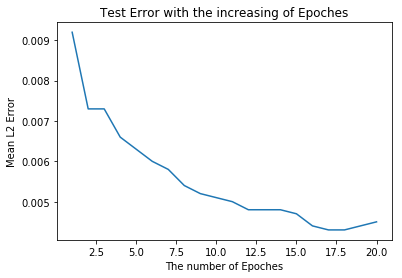

In [30]:
import pylab as pl

# Paste the data
MSE_1 = [0.0092,0.0073,0.0073,0.0066,0.0063,
         0.0060,0.0058,0.0054,0.0052,0.0051,
         0.0050,0.0048,0.0048,0.0048,0.0047,
         0.0044,0.0043,0.0043,0.0044,0.0045]
Epoches = [1,2,3,4,5,
           6,7,8,9,10,
           11,12,13,14,15,
           16,17,18,19,20]

# Plot
pl.plot(Epoches,MSE_1)
pl.title("Test Error with the increasing of Epoches")
pl.xlabel("The number of Epoches")
pl.ylabel("Mean L2 Error")
pl.show()

It could be found that with the increasing number of epoches, the error decreased quickly at first, then tended to be convergence, the minimum error is 0.0043

## Plot the best - worst set of digits as measured by error

In [10]:
decoded_imgs_1 = autoencoder_1.predict(x_test_modified)
error_1 = []

for i in range(decoded_imgs_1.shape[0]):    
    error_1.append(distance.euclidean(decoded_imgs_1[i].flatten(),x_test[i].flatten()))

The original best set of digits is as following:


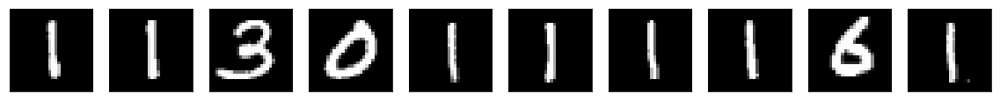

The predict best set of digits is as following:


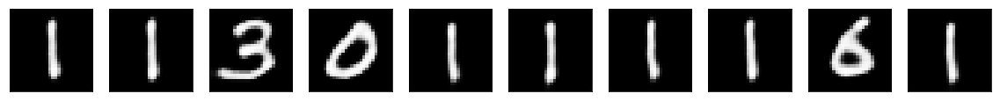

The original worst set of digits is as following:


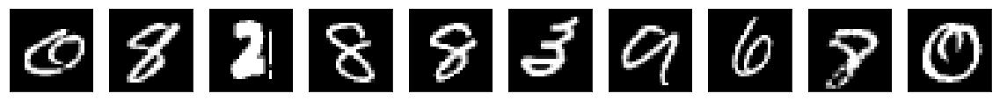

The predict worst set of digits is as following:


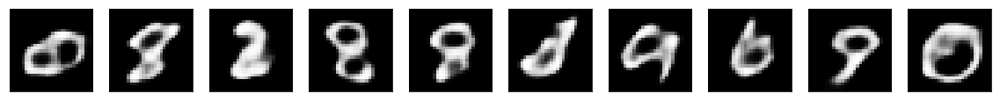

In [11]:
# Get the index of the best and worst top 10
error_pd = pd.Series(error_1)
error_index = error_pd.sort_values()
best_index_1 = error_index.index[:10]
worst_index_1 = error_index.index[-10:]
plot(decoded_imgs_1, best_index_1, worst_index_1)

## 2 - Vary the CNN architecture - Add the convolutional layer

Architecture: 4 Convolution layers with filter number 16,8,8,8 for each + 3 Pooling Layers

In [12]:
input_img = Input(shape=(28, 28, 1))  # adapt this if using `channels_first` image data format

x = Conv2D(16, (3, 3), activation='relu', padding='same')(input_img) #26*26
x = Conv2D(8, (3, 3), activation='relu', padding='same')(x) #24*24
x = MaxPooling2D((2, 2), padding='same')(x) #12*12
x = Conv2D(8, (3, 3), activation='relu', padding='same')(x) #10*10
x = MaxPooling2D((2, 2), padding='same')(x) #5*5
x = Conv2D(8, (3, 3), activation='relu', padding='same')(x) #3*3
encoded = MaxPooling2D((2, 2), padding='same')(x)

# at this point the representation is (4, 4, 8) i.e. 128-dimensional

x = Conv2D(8, (3, 3), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)
x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(8, (3, 3), activation='relu', padding='same')(x)
x = Conv2D(16, (3, 3), activation='relu')(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

autoencoder_2 = Model(input_img, decoded)
autoencoder_2.compile(optimizer='adadelta', loss='binary_crossentropy', metrics=['mse'])

In [27]:
from keras.callbacks import TensorBoard

autoencoder_2.fit(x_train_modified, x_train,
                epochs=20,
                batch_size=128,
                shuffle=True,
                validation_data=(x_test_modified, x_test),
                callbacks=[TensorBoard(log_dir='/tmp/autoencoder')])

Train on 120000 samples, validate on 10000 samples
Epoch 1/20
120000/120000 [==============================] - 283s - loss: 0.1362 - mean_squared_error: 0.0250 - val_loss: 0.1269 - val_mean_squared_error: 0.0217

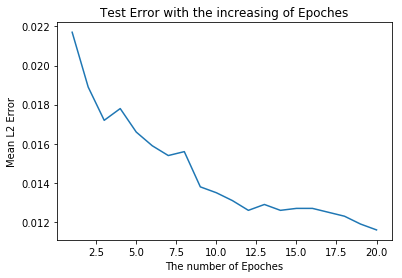

In [31]:
import pylab as pl

# Paste the data
MSE_1 = [0.0217,0.0189,0.0172,0.0178,0.0166,
         0.0159,0.0154,0.0156,0.0138,0.0135,
         0.0131,0.0126,0.0129,0.0126,0.0127,
         0.0127,0.0125,0.0123,0.0119,0.0116]
Epoches = [1,2,3,4,5,
           6,7,8,9,10,
           11,12,13,14,15,
           16,17,18,19,20]

# Plot
pl.plot(Epoches,MSE_1)
pl.title("Test Error with the increasing of Epoches")
pl.xlabel("The number of Epoches")
pl.ylabel("Mean L2 Error")
pl.show()

It could be found that with the increasing number of epoches, the error decreased quickly at first, then tended to be convergence, the minimum error is 0.0116

## Plot the best - worst set of digits as measured by error

In [24]:
decoded_imgs_2 = autoencoder_2.predict(x_test_modified)
error_2 = []

for i in range(decoded_imgs_2.shape[0]):    
    error_2.append(distance.euclidean(decoded_imgs_2[i].flatten(),x_test[i].flatten()))

The original best set of digits is as following:


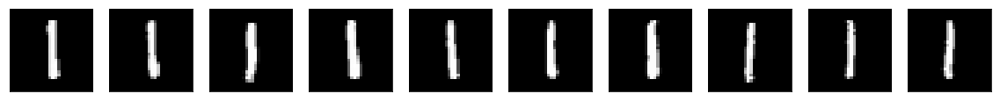

The predict best set of digits is as following:


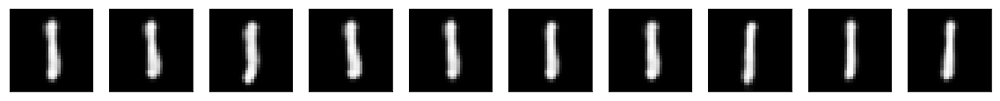

The original worst set of digits is as following:


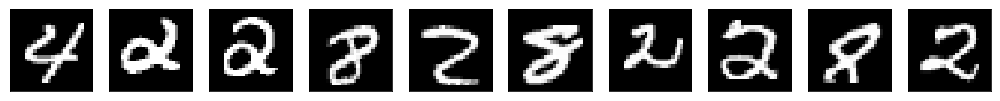

The predict worst set of digits is as following:


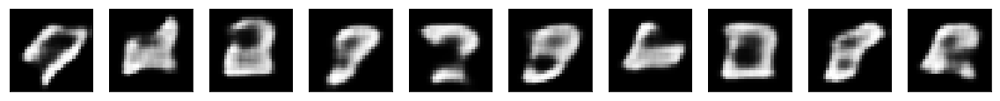

In [25]:
# Get the index of the best and worst top 10
error_pd = pd.Series(error_2)
error_index = error_pd.sort_values()
best_index_2 = error_index.index[:10]
worst_index_2 = error_index.index[-10:]
plot(decoded_imgs_2, best_index_2, worst_index_2)

## 3 - Vary the CNN architecture - Add the filter numbers

Architecture: 3 Convolution layers with filter number 32,16,16 for each + 3 Pooling Layers

In [14]:
input_img = Input(shape=(28, 28, 1))  # adapt this if using `channels_first` image data format

x = Conv2D(32, (3, 3), activation='relu', padding='same')(input_img)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(16, (3, 3), activation='relu', padding='same')(x)
x = MaxPooling2D((2, 2), padding='same')(x)
x = Conv2D(16, (3, 3), activation='relu', padding='same')(x)
encoded = MaxPooling2D((2, 2), padding='same')(x)

# at this point the representation is (4, 4, 8) i.e. 128-dimensional

x = Conv2D(16, (3, 3), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)
x = Conv2D(16, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(32, (3, 3), activation='relu')(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

autoencoder_3 = Model(input_img, decoded)
autoencoder_3.compile(optimizer='adadelta', loss='binary_crossentropy', metrics=['mse'])

In [28]:
from keras.callbacks import TensorBoard

autoencoder_3.fit(x_train_modified, x_train,
                epochs=20,
                batch_size=128,
                shuffle=True,
                validation_data=(x_test_modified, x_test),
                callbacks=[TensorBoard(log_dir='/tmp/autoencoder')])

Train on 120000 samples, validate on 10000 samples
Epoch 1/20
120000/120000 [==============================] - 363s - loss: 0.1247 - mean_squared_error: 0.0209 - val_loss: 0.1166 - val_mean_squared_error: 0.0183

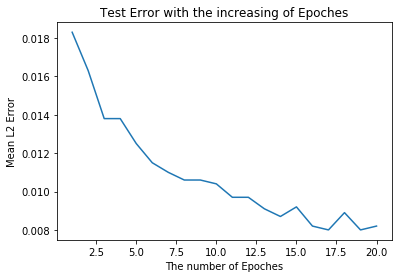

In [32]:
import pylab as pl

# Paste the data
MSE_1 = [0.0183,0.0163,0.0138,0.0138,0.0125,
         0.0115,0.0110,0.0106,0.0106,0.0104,
         0.0097,0.0097,0.0091,0.0087,0.0092,
         0.0082,0.0080,0.0089,0.0080,0.0082]
Epoches = [1,2,3,4,5,
           6,7,8,9,10,
           11,12,13,14,15,
           16,17,18,19,20]

# Plot
pl.plot(Epoches,MSE_1)
pl.title("Test Error with the increasing of Epoches")
pl.xlabel("The number of Epoches")
pl.ylabel("Mean L2 Error")
pl.show()

It could be found that with the increasing number of epoches, the error decreased quickly at first, then tended to be convergence, the minimum error is 0.0080

## Plot the best - worst set of digits as measured by error

In [22]:
decoded_imgs_3 = autoencoder_3.predict(x_test_modified)
error_3 = []

for i in range(decoded_imgs_3.shape[0]):    
    error_3.append(distance.euclidean(decoded_imgs_3[i].flatten(),x_test[i].flatten()))

The original best set of digits is as following:


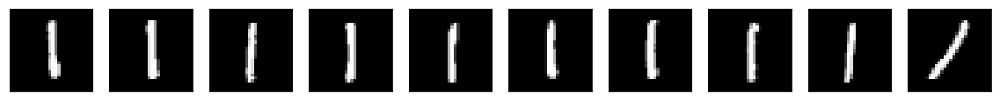

The predict best set of digits is as following:


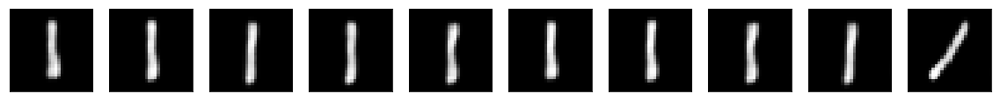

The original worst set of digits is as following:


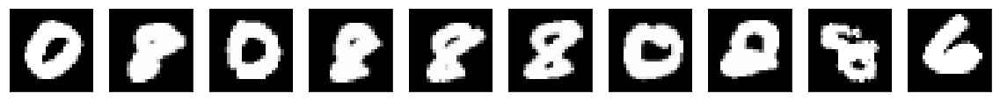

The predict worst set of digits is as following:


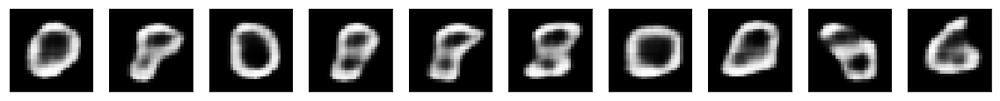

In [23]:
# Get the index of the best and worst top 10
error_pd = pd.Series(error_3)
error_index = error_pd.sort_values()
best_index_3 = error_index.index[:10]
worst_index_3 = error_index.index[-10:]
plot(decoded_imgs_3, best_index_3, worst_index_3)

## 4 - Vary the CNN architecture - Reduce the filter numebrs, improve the # layers

Architecture: 4 Convolution layers with filter number 8,6,6,6 for each + 3 Pooling Layers

In [16]:
input_img = Input(shape=(28, 28, 1))  # adapt this if using `channels_first` image data format

x = Conv2D(8, (3, 3), activation='relu', padding='same')(input_img) #26*26
x = Conv2D(6, (3, 3), activation='relu', padding='same')(x) #24*24
x = MaxPooling2D((2, 2), padding='same')(x) #12*12
x = Conv2D(6, (3, 3), activation='relu', padding='same')(x) #10*10
x = MaxPooling2D((2, 2), padding='same')(x) #5*5
x = Conv2D(6, (3, 3), activation='relu', padding='same')(x) #3*3
encoded = MaxPooling2D((2, 2), padding='same')(x)

# at this point the representation is (4, 4, 8) i.e. 128-dimensional

x = Conv2D(6, (3, 3), activation='relu', padding='same')(encoded)
x = UpSampling2D((2, 2))(x)
x = Conv2D(6, (3, 3), activation='relu', padding='same')(x)
x = UpSampling2D((2, 2))(x)
x = Conv2D(6, (3, 3), activation='relu', padding='same')(x)
x = Conv2D(8, (3, 3), activation='relu')(x)
x = UpSampling2D((2, 2))(x)
decoded = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(x)

autoencoder_4 = Model(input_img, decoded)
autoencoder_4.compile(optimizer='adadelta', loss='binary_crossentropy', metrics=['mse'])

In [29]:
from keras.callbacks import TensorBoard

autoencoder_4.fit(x_train_modified, x_train,
                epochs=20,
                batch_size=128,
                shuffle=True,
                validation_data=(x_test_modified, x_test),
                callbacks=[TensorBoard(log_dir='/tmp/autoencoder')])

Train on 120000 samples, validate on 10000 samples
Epoch 1/20
120000/120000 [==============================] - 207s - loss: 0.1556 - mean_squared_error: 0.0315 - val_loss: 0.1449 - val_mean_squared_error: 0.0277

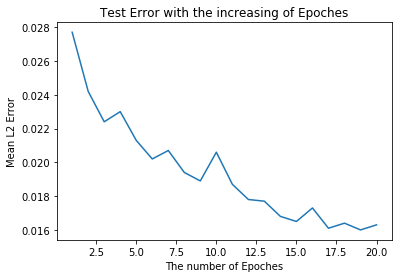

In [33]:
import pylab as pl

# Paste the data
MSE_1 = [0.0277,0.0242,0.0224,0.0230,0.0213,
         0.0202,0.0207,0.0194,0.0189,0.0206,
         0.0187,0.0178,0.0177,0.0168,0.0165,
         0.0173,0.0161,0.0164,0.0160,0.0163]
Epoches = [1,2,3,4,5,
           6,7,8,9,10,
           11,12,13,14,15,
           16,17,18,19,20]

# Plot
pl.plot(Epoches,MSE_1)
pl.title("Test Error with the increasing of Epoches")
pl.xlabel("The number of Epoches")
pl.ylabel("Mean L2 Error")
pl.show()

It could be found that with the increasing number of epoches, the error decreased quickly at first, then tended to be convergence, the minimum error is 0.0160

## Plot the best - worst set of digits as measured by error

In [19]:
decoded_imgs_4 = autoencoder_4.predict(x_test_modified)
error_4 = []

for i in range(decoded_imgs_4.shape[0]):    
    error_4.append(distance.euclidean(decoded_imgs_4[i].flatten(),x_test[i].flatten()))

The original best set of digits is as following:


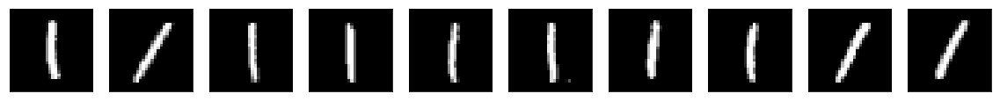

The predict best set of digits is as following:


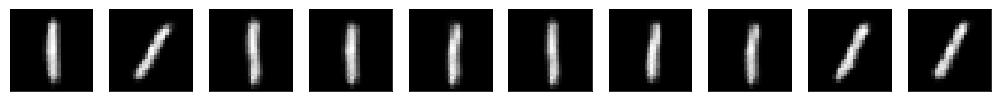

The original worst set of digits is as following:


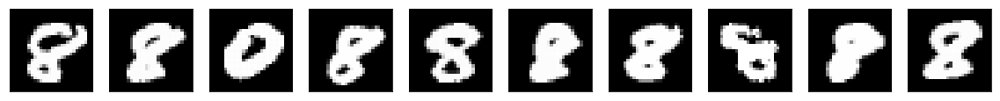

The predict worst set of digits is as following:


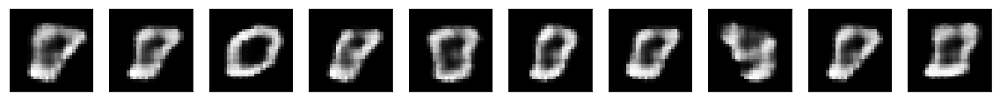

In [21]:
# Get the index of the best and worst top 10
error_pd = pd.Series(error_4)
error_index = error_pd.sort_values()
best_index_4 = error_index.index[:10]
worst_index_4 = error_index.index[-10:]
plot(decoded_imgs_4, best_index_4, worst_index_4)

End